<img src="../.images/logosnb.png" alt="Banner" style="width: 800px;"/>

<div style='color: #690027;' markdown="1">
    <h1>REGRESSIE MET DE IRIS VIRGINICA</h1> 
</div>

<div class="alert alert-box alert-success">
In deze notebook zie je hoe een <em>machinaal leren</em>-systeem erin slaagt een <b>best passende rechte</b> te vinden bij een gegeven verzameling van punten. Het algoritme vertrekt daarbij van een willekeurig gekozen rechte. Het algortime past de coëfficiënten in de vergelijking van deze rechte aan, gebaseerd op de gegeven data, totdat uiteindelijk de <b>regressielijn</b> wordt bekomen.
</div>

De Iris dataset werd in 1936 door de Brit Ronald Fischer gepubliceerd in 'The use of multiple measurements in taxonomic problems' [1][2].<br> 
De dataset betreft drie soorten irissen (*Iris setosa*, *Iris virginica* en *Iris versicolor*), 50 monsters van elke soort.
Fischer kon de soorten van elkaar onderscheiden afgaande op vier kenmerken: de lengte en de breedte van de kelkbladen en de bloembladen.

<img src="../.images/IntroductieMachineLearning/bloemblad-kelkblad.jpg" alt="Drawing" style="width: 200px;"/> 

In deze notebook gebruik je enkel de gegevens over de lengte van de kelkblaadjes en de bloemblaadjes van de *Iris virginica*.

<center><img src="../.images/IntroductieMachineLearning/Iris_virginica.jpg" alt="Drawing" style="width: 203px;"/></center>
<center>Figuur 1: *Iris virginica* [3]</center>

### De nodige modules importeren

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from matplotlib import animation
from IPython.display import HTML

<div style='color: #690027;' markdown="1">
    <h2>1. De data van de <em>Iris virginica</em></h2> 
</div>

Lees met de module `pandas` de dataset in.

In [2]:
# dataset inlezen
virginica = pd.read_csv("../.data/IntroductieMachineLearning/virginica.dat")

Kijk de gegevens in. Dit kan zeer eenvoudig door de naam van de tabel in te geven. Beide kenmerken worden weergegeven. Het aantal monsters is gemakkelijk af te lezen.

In [3]:
# dataset weergeven in tabel
virginica

,lengte kelkblad,lengte bloemblad
0,6.3,6.0
1,5.8,5.1
2,7.1,5.9
3,6.3,5.6
4,6.5,5.8
5,7.6,6.6
6,4.9,4.5
7,7.3,6.3
8,6.7,5.8
9,7.2,6.1


De relatie tussen de lengte van het kelkblad en de lengte van het bloemblad wordt bestudeerd. <br> Daarvoor wordt de lengte van het bloemblad uitgezet in functie van de lengte van het kelkblad. De lengte van het bloemblad komt dus op de y-as en de lengte van het kelkblad op de x-as.

<div class="alert alert-box alert-info">
Voor het machinaal leren-systeem zal de <em>lengte van het kelkblad</em> als <b>input</b> dienen en de <em>lengte van het bloemblad</em> als <b>output</b>.
</div>

In [4]:
x = virginica["lengte kelkblad"]       # naam kolom als index gebruiken
y = virginica["lengte bloemblad"]

<div style='color: #690027;' markdown="1">
    <h2>2. De samenhang tussen beide kenmerken visualiseren via een regressielijn</h2> 
</div>

We standaardiseren de gegevens en geven ze weer in een puntenwolk. We berekenen de correlatiecoëfficiënt om te bekijken hoe sterk de samenhang tussen de twee kenmerken is.<br>
Vervolgens wordt de regressielijn gezocht en getekend.<br>
Met deze regressielijn wordt de lengte van een bloemblad voorspeld voor een gekende lengte van een kelkblad.

<div style='color: #690027;' markdown="1">
    <h3>2.1 De data standaardiseren</h3> 
</div>

Om te standaardiseren wordt er overgegaan op de Z-scores van de kenmerken.<br>
Voor meer uitleg over het belang van standaardiseren verwijzen we naar de notebook 'Standaardiseren'.

In [5]:
x = (x-np.mean(x))/np.std(x)
y = (y-np.mean(y))/np.std(y)

<div style='color: #690027;' markdown="1">
    <h3>2.2 De gestandaardiseerde data weergeven in puntenwolk</h3> 
</div>

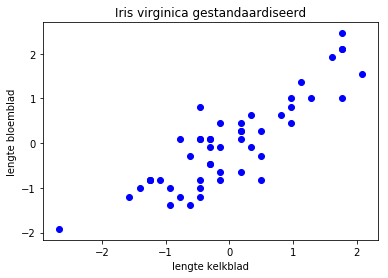

In [6]:
# lengte bloemblad t.o.v. lengte kelkblad
# lengte kelkblad komt op x-as, lengte bloemblad komt op y-as
plt.scatter(x, y, color="blue", marker="o")  # puntenwolk

plt.title("Iris virginica gestandaardiseerd")
plt.xlabel("lengte kelkblad")          # xlabel geeft een omschrijving op de x-as
plt.ylabel("lengte bloemblad")         # ylabel geeft een omschrijving op de y-as

plt.show()

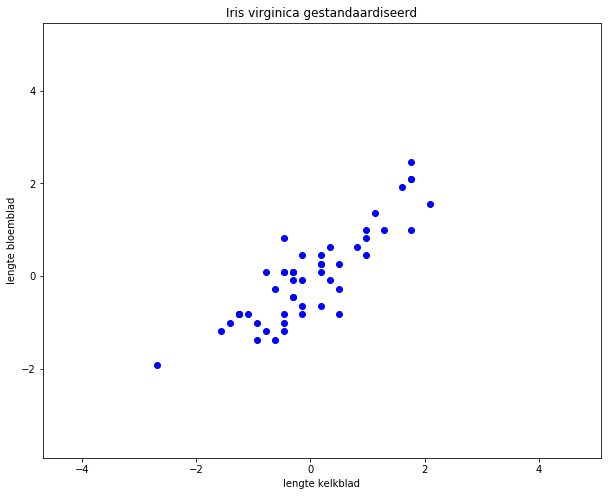

In [7]:
plt.figure(figsize=(10,8))    # om een grotere grafiek te krijgen, zodat punten meer verspreid liggen
# bereik zo kiezen opdat geschikt voor grotere en kleinere blaadjes
plt.xlim(x.min()-2, x.max()+3)
plt.ylim(y.min()-2, y.max()+3)
plt.scatter(x, y, color="blue", marker="o")

plt.title("Iris virginica gestandaardiseerd")
plt.xlabel("lengte kelkblad")          
plt.ylabel("lengte bloemblad")         

plt.show()

<div style='color: #690027;' markdown="1">
    <h3>2.3 Samenhang tussen x en y?</h3> 
</div>


In [8]:
# in hoeverre is er een verband tussen de x- en y- coördinaat van deze punten? 
# correlatiecoefficiënt bepalen (ligt tussen -1 en 1, hoe dichter bij 0, hoe slechter de samenhang)
r = np.corrcoef(x, y)[0,1]
print("R = ", r)

R =  0.864224732935576


Zeer goede samenhang!

<div style='color: #690027;' markdown="1">
    <h3>2.4 Regressielijn</h3> 
</div>

Bepaal de regressielijn met ingebouwde functies van de module scikit-learn, een Python-module met machine learning algoritmes. <br> Om zo'n algoritme te kunnen gebruiken, moet de *data in het gewenste formaat* worden aangeboden. Voor de y-waarden volstaat een 1D-array, maar voor de x-waarden moet de 1D-array worden omgezet naat een 2D-array.

In [9]:
# lineaire regressie
X = x[:, np.newaxis]          # data in gewenste formaat aanbieden aan ML-systeem
rechte = LinearRegression()   # rechte wordt bepaald met lineaire regressie
rechte.fit(X, y)              # deze rechte moet passen bij data (X,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

R² en de gemiddelde kwadratische afwijking berekenen:

In [10]:
# belangrijke getallen
print("R² voor de rechte m.b.t. de data: %.3f" % r2_score(y, rechte.predict(X)))
print("Gemiddelde kwadratische afwijking voor de rechte m.b.t. de data: %.2f"% mean_squared_error(y, rechte.predict(X)))

R² voor de rechte m.b.t. de data: 0.747
Gemiddelde kwadratische afwijking voor de rechte m.b.t. de data: 0.25


Grafiek van puntenwolk en regressielijn laten zien:

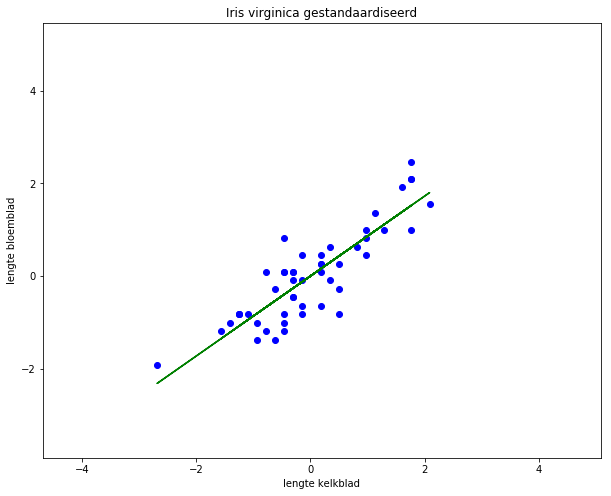

In [11]:
# grafiek van puntenwolk en regressielijn
plt.figure(figsize=(10,8))
plt.xlim(x.min()-2, x.max()+3)
plt.ylim(y.min()-2, y.max()+3)
plt.title("Iris virginica gestandaardiseerd")
plt.xlabel("lengte kelkblad")          # xlabel geeft een omschrijving op de x-as
plt.ylabel("lengte bloemblad")         # ylabel geeft een omschrijving op de y-as

plt.scatter(x, y, color="blue", marker="o")     # puntenwolk
plt.plot(x, rechte.predict(X), color='green')   # gevonden regressielijn

plt.show()

Uit het model kan je rechtstreeks de richtingscoëfficiënt van de regressielijn bepalen en waar ze de y-as snijdt.

In [12]:
# berekenen rico en doorgang y-as
x_O = np.array([0])
X_O = x_O[:, np.newaxis]     # data aanbieden in gewenste formaat
y_O_predict = rechte.predict(X_O)
x_1 = np.array([1])
X_1 = x_1[:, np.newaxis]     # data aanbieden in gewenste formaat
y_1_predict = rechte.predict(X_1)
print("De regressielijn snijdt de y-as in: %.3f" % y_O_predict)
print("De regressielijn heeft als rico: %.3f" % (y_1_predict - y_O_predict))

De regressielijn snijdt de y-as in: -0.000
De regressielijn heeft als rico: 0.864


<div style='color: #690027;' markdown="1">
    <h3>2.5 Voorspellingen doen met het model</h3> 
</div>

Je kan met het model gebruiken voorspellingen doen bij nieuwe data: bv. de lengte van het bloemblad voorspellen als je de lengte van een kelkblad kent.

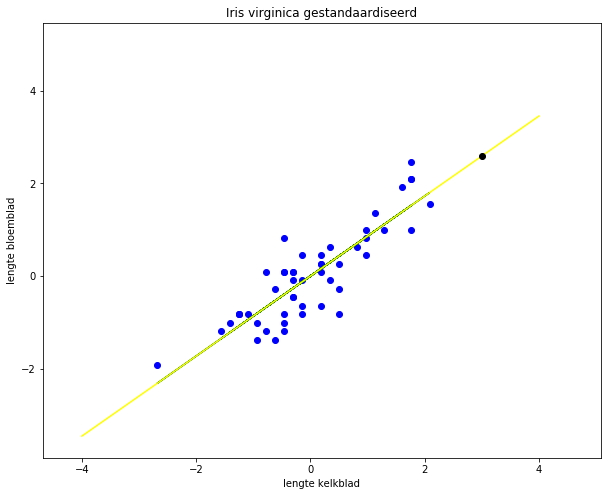

Bij een kelkblad met gestandaardiseerde lengte 3 is de gestandaardiseerde lengte van het bloemblad bij benadering 2.592674198806725.


In [13]:
# lengte bloemblad voorspellen bij gekende lengte kelkblad
x_gekend = np.array([3])               # kelkblad met gestandaardiseerde lengte gelijk aan 3
X_gekend = x_gekend[:, np.newaxis]     # data aanbieden in gewenste formaat
y_predict = rechte.predict(X_gekend)   # lengte bloemblad bepalen met model

plt.figure(figsize=(10,8))
plt.xlim(x.min()-2, x.max()+3)
plt.ylim(y.min()-2, y.max()+3)
plt.title("Iris virginica gestandaardiseerd")
plt.xlabel("lengte kelkblad")          
plt.ylabel("lengte bloemblad")         

x_nieuw =  np.linspace(-4, 4, 67)      # rechte langer tekenen
X_nieuw = x_nieuw[:, np.newaxis]       # gewenste formaat

plt.scatter(x, y, color="blue", marker="o")     # puntenwolk
plt.plot(x, rechte.predict(X), color='green')   # gevonden regressielijn
plt.plot(x_nieuw, rechte.predict(X_nieuw), color='yellow')   # gevonden regressielijn verlengd
plt.plot(x_gekend[0], y_predict[0], color = "black", marker = "o")  # voorspelde punt

plt.show()

print("Bij een kelkblad met gestandaardiseerde lengte " + str(x_gekend[0]) + 
      " is de gestandaardiseerde lengte van het bloemblad bij benadering " + str(y_predict[0]) + ".")

Probeer eens hetzelfde met een andere afmeting voor het kelkblad.

<div style='color: #690027;' markdown="1">
    <h2>3. Stap voor stap op zoek naar de regressielijn</h2> 
</div>

<div style='color: #690027;' markdown="1">
    <h3>3.1 Opbouw van het algoritme</h3> 
</div>


Zo'n regressielijn wordt gezocht met een algoritme. Hier zie je hoe zo'n algoritme is opgebouwd.  

Er wordt nog steeds met dezelfde gestandaardiseerde data x en y gewerkt. 

<div class="alert alert-box alert-info">
Om een rechte te vinden die goed bij de gegeven data past, vertrekt het ML-systeem van een willekeurig gekozen rechte. Dit gebeurt door de richtingscoëfficiënt en het snijpunt met de y-as van deze rechte willekeurig te kiezen.<br>  
Het systeem wordt *getraind* met de trainingset (de inputs en de corresponderende outputs): Voor elk punt van de trainingset wordt nagegaan hoeveel de corresponderende y-waarde op de voorlopige rechte afwijkt van de gegeven y-waarde. De coëfficiënten in de vergelijking van de rechte worden aangepast zodat de gemiddelde afwijking voor de hele datset minimaal is. <br>
De volledige trainingset wordt een aantal keer doorlopen. Zo'n keer noemt men een *epoch*. Het systeem *leert* gedurende deze *pogingen ('epochs')*.
</div>

In [14]:
# trainingset met input x en output y
print(x, y)

0    -0.457514
1    -1.251810
2     0.813359
3    -0.457514
4    -0.139796
5     1.607654
6    -2.681541
7     1.131077
8     0.177922
9     0.972218
10   -0.139796
11   -0.298655
12    0.336781
13   -1.410669
14   -1.251810
15   -0.298655
16   -0.139796
17    1.766513
18    1.766513
19   -0.934091
20    0.495640
21   -1.569528
22    1.766513
23   -0.457514
24    0.177922
25    0.972218
26   -0.616373
27   -0.775232
28   -0.298655
29    0.972218
30    1.289936
31    2.084231
32   -0.298655
33   -0.457514
34   -0.775232
35    1.766513
36   -0.457514
37   -0.298655
38   -0.934091
39    0.495640
40    0.177922
41    0.495640
42   -1.251810
43    0.336781
44    0.177922
45    0.177922
46   -0.457514
47   -0.139796
48   -0.616373
49   -1.092951
Name: lengte kelkblad, dtype: float64 0     0.819990
1    -0.827312
2     0.636957
3     0.087856
4     0.453923
5     1.918192
6    -1.925513
7     1.369091
8     0.453923
9     1.003024
10   -0.827312
11   -0.461245
12   -0.095177
13   -1.010345
14

Het systeem moet de gemiddelde kwadratische afwijking kunnen berekenen van de datapunten tot de bepaalde rechte.<br>Daartoe wordt voor elk punt het residu $y-\hat{y}$ berekend. Hierbij is $y$ de gegeven y-waarde en $\hat{y}$ de voorspelde waarde, nl. de waarde die men bekomt door de gegeven x-waarde in te vullen in de vergelijking van de rechte.<br> De kwadraten van de residu's worden bij elkaar opgeteld. Deze som gedeeld door het aantal datapunten is de gezochte fout. 

In [15]:
def gka(b, a, x, y):
    "Gemiddelde kwadratische afwijking berekenen van punten tot rechte"
    
    totale_afw = 0
    n = len(x)            # aantal punten
    y_rechte = a * x + b  # y-waarden voor een bepaalde rechte
    
    # som kwadratische afwijkingen bij alle punten
    for i in range(n):
        totale_afw += (y[i] - y_rechte[i]) ** 2  
    
    return totale_afw/50

Als voorbeeld kan je de gemiddelde kwadratische afwijking laten berekenen t.o.v. de x-as:

In [16]:
# gemiddelde kwadratische afwijking van de tariningdata t.o.v. de rechte y = 0
fout = gka(0,0,x,y)
print(fout)

1.0000000000000002


<div class="alert alert-box alert-info">
Het ML-systeem vertrekt van een willekeurige rechte met vergelijking *y = mx + q*. Bij het begin van de training worden *m* en *q* gekozen. Ook het aantal *epochs* en de *learning rate* $\eta$ worden vastgelegd.
</div>

Het algoritme zal de coëfficiënten van de rechte zo bepalen dat de fout geminimaliseerd wordt. Het doet dat met de methode **gradient descent**.<br>
Na elke *epoch* worden de coëfficiënten aangepast, afhankelijk van de waarden van de partiële afgeleiden en de *learning rate*.

In [17]:
def gradient_descent(q, m, x, y, eta):
    "Aanpassing parameters q en m na voltooide epoch met learning rate eta."
    
    n = len(x)
    y_huidig = m * x + q      # gevonden rechte op bepaald moment in proces
    afgeleide_m = 0           # partiële afgeleide naar m declareren en initialiseren
    afgeleide_q = 0           # partiële afgeleide naar q declareren en initialiseren
    
    # berekenen van de partiële afgeleiden
    for i in range(n):
        afgeleide_m += - (2/n) * x[i] * (y[i] - y_huidig[i])
        afgeleide_q += - (2/n) * (y[i] - y_huidig[i])
    
    # waarden van m en q aanpassen
    m = m - eta * afgeleide_m
    q = q - eta * afgeleide_q
     
    # aangepaste waarden van m en q teruggeven
    return q, m

<div style='color: #690027;' markdown="1">
    <h3>3.2 Uittesten van het algoritme van gradient descent voor meerdere epochs</h3> 
</div>

Neem 0 als initiële waarde voor m en voor q. Voer gradient descent uit voor 3000 epochs en met learning rate 0,01, waarbij de aanpassingen de fout na elke epoch wordt getoond. 

In [18]:
# algoritme testen
q=0
m=0
eta = 0.01

for j in range(3000):
    fout = gka(q,m,x,y)                    # gemiddelde kwadratische afwijking berekenen na elke epoch
    print(q, m, fout)                      # waarden q, m en fout tonen na elke epoch
    q, m = gradient_descent(q,m,x,y,eta)   # waarden q en m aanpassen na elke epoch 
    
print("De rechte snijdt de y-as in: %.3f" % q)
print("De rechte heeft als rico: %.3f" % m)
print("Gemiddelde kwadratische afwijking voor de rechte m.b.t. de data: %.2f"% fout)

0 0 1.0000000000000002
1.1796119636642288e-17 0.017284494658711517 0.9704233781949039
2.185751579730777e-17 0.034223299424248815 0.9420179906132898
3.150257832373882e-17 0.05082332809447537 0.9147374563799082
4.0349668051220536e-17 0.06709135619129739 0.8885372313021682
4.787836793695988e-17 0.08303402372618296 0.8633745351375065
5.3741733285761485e-17 0.09865783791037082 0.8392082817409653
5.939693181744588e-17 0.11396917581087493 0.8159990119789277
6.411537967210279e-17 0.12897428695336896 0.7937088292994663
6.803585472781037e-17 0.1436792958730131 0.7723013378541114
7.101957910649048e-17 0.15809020461426435 0.7517415830699927
7.327471962526032e-17 0.17221289518069058 0.7319959945753257
7.552986014403017e-17 0.1860531319357883 0.7130323313850472
7.653599976009671e-17 0.19961656395578403 0.6948196292571035
7.552986014403017e-17 0.21290872733537988 0.6773281501334266
7.39339145461315e-17 0.2259350474473838 0.6605293335830473
7.21991910701547e-17 0.23870084115714765 0.644395750168063
6.

-1.4981191200774677e-15 0.8379983869728532 0.2538034322049883
-1.5025730226020381e-15 0.8385229138921076 0.253776194484575
-1.5076817832387899e-15 0.839036950272977 0.25375003537789015
-1.5117020048943661e-15 0.839540705926229 0.25372491217183
-1.5161689178450065e-15 0.8400343864664159 0.2537007838447299
-1.5205621050479178e-15 0.8405181933957991 0.2536776109993829
-1.5248165143727509e-15 0.8409923241865946 0.2536553557987116
-1.5295479726534776e-15 0.8414569723615742 0.2536339819039869
-1.5336766145263024e-15 0.8419123275730542 0.2536134544154933
-1.5383343470593e-15 0.8423585756803047 0.25359373981554406
-1.5427839127751806e-15 0.8427958988254102 0.2535748059137528
-1.5458110052407601e-15 0.8432244755076135 0.25355662179447247
-1.549870258174546e-15 0.8436444806561727 0.25353915776631575
-1.5546103900726525e-15 0.8440560857017607 0.25352238531367394
-1.5583660663981422e-15 0.844459458646437 0.25350627705015666
-1.5617834716458166e-15 0.8448547641322198 0.2534908066738748
-1.566410846

-1.7656438377339205e-15 0.862544056619611 0.2531184356553109
-1.7662943590374118e-15 0.8625776701459302 0.2531183237982649
-1.7671356999232605e-15 0.8626106114017231 0.253118216370758
-1.768159186774087e-15 0.8626428938324002 0.25311811319738015
-1.7684193952954834e-15 0.8626745306144638 0.2531180141096682
-1.768896444251377e-15 0.862705534660886 0.2531179189458297
-1.7697724796067453e-15 0.8627359186263798 0.25311782755047907
-1.7706485149621135e-15 0.8627656949125637 0.2531177397743844
-1.771437814143683e-15 0.8627948756730239 0.25311765547422316
-1.7715418975522416e-15 0.862823472818275 0.25311757451234823
-1.7719408839517163e-15 0.862851498020621 0.2531174967565635
-1.7726694678116265e-15 0.8628789627189201 0.25311742207990784
-1.7740225521228883e-15 0.8629058781232531 0.2531173503604478
-1.7741353091488269e-15 0.8629322552194996 0.25311728148107826
-1.774733788748039e-15 0.8629581047738211 0.25311721532933196
-1.7753582891993906e-15 0.8629834373370562 0.2531171517971947
-1.7757919

-1.8172171666747127e-15 0.8641331026627272 0.25311561937853877
-1.8167661385709588e-15 0.8641349352681842 0.25311561904605295
-1.8162717423803053e-15 0.864136731221532 0.2531156187267335
-1.8166533815450202e-15 0.8641384912558129 0.25311561842005914
-1.8167834858057185e-15 0.8641402160894082 0.25311561812552913
-1.817191145822573e-15 0.8641419064263315 0.2531156178426625
-1.8172865556137518e-15 0.8641435629565164 0.2531156175709974
-1.817572784987288e-15 0.8641451863560976 0.2531156173100902
-1.8189345429159298e-15 0.8641467772876872 0.25311561705951496
-1.819012605472349e-15 0.8641483364006449 0.2531156168188623
-1.8202442591402925e-15 0.8641498643313436 0.25311561658773973
-1.8203917106357506e-15 0.8641513617034282 0.2531156163657695
-1.820573856600728e-15 0.8641528291280711 0.2531156161525894
-1.8207646761830854e-15 0.8641542672042212 0.25311561594785115
-1.8209641693828228e-15 0.8641556765188483 0.25311561575122055
-1.8209034540611635e-15 0.8641570576471829 0.25311561556237655
-1.8

-1.8311209753346682e-15 0.8642215298573532 0.25311561099269153
-1.8320837468638354e-15 0.8642215939189177 0.25311561099228524
-1.830756683404713e-15 0.8642216566992509 0.25311561099189506
-1.8296985020843673e-15 0.8642217182239774 0.25311561099152025
-1.829724522936507e-15 0.8642217785182094 0.25311561099116037
-1.830331676153099e-15 0.8642218376065567 0.25311561099081475
-1.8302102455097806e-15 0.8642218955131371 0.25311561099048274
-1.830166877422881e-15 0.8642219522615859 0.25311561099016394
-1.8305311693528362e-15 0.8642220078750658 0.25311561098985785
-1.8309648502218304e-15 0.864222062376276 0.2531156109895637
-1.831077607247769e-15 0.864222115787462 0.25311561098928137
-1.8316413923774616e-15 0.8642221681304243 0.25311561098901014
-1.832586816671869e-15 0.8642222194265273 0.25311561098874963
-1.832578143054489e-15 0.8642222696967083 0.25311561098849933
-1.8330638656277624e-15 0.8642223189614857 0.2531156109882591
-1.831892927281478e-15 0.8642223672409676 0.2531156109880283
-1.83

-1.830349023387857e-15 0.8642246209670116 0.25311561098244434
-1.8309735238392085e-15 0.8642246232063828 0.25311561098244384
-1.8316413923774596e-15 0.8642246254009667 0.25311561098244334
-1.8319276217509957e-15 0.8642246275516589 0.25311561098244284
-1.8321010940985932e-15 0.8642246296593372 0.25311561098244245
-1.8317107813164986e-15 0.864224631724862 0.2531156109824421
-1.8317975174902974e-15 0.8642246337490762 0.2531156109824416
-1.8318582328119567e-15 0.8642246357328062 0.25311561098244134
-1.831702107699119e-15 0.8642246376768615 0.2531156109824409
-1.8314072047082027e-15 0.8642246395820358 0.25311561098244056
-1.8316674132295994e-15 0.8642246414491066 0.2531156109824402
-1.8307566834047114e-15 0.864224643278836 0.2531156109824399
-1.8311816906563256e-15 0.8642246450719707 0.25311561098243957
-1.8310429127782475e-15 0.8642246468292428 0.2531156109824393
-1.831094954482527e-15 0.8642246485513695 0.253115610982439
-1.8319449689857555e-15 0.8642246502390536 0.2531156109824386
-1.832

-1.8308954612827875e-15 0.8642247263172721 0.25311561098243185
-1.8302796344488157e-15 0.8642247264496382 0.25311561098243185
-1.8299934050752796e-15 0.864224726579357 0.2531156109824319
-1.8305918846744916e-15 0.8642247267064814 0.25311561098243196
-1.8305398429702124e-15 0.8642247268310633 0.25311561098243185
-1.831034239160866e-15 0.8642247269531536 0.2531156109824318
-1.8308520931958883e-15 0.864224727072802 0.2531156109824318
-1.8307827042568493e-15 0.8642247271900574 0.25311561098243185
-1.831155669804184e-15 0.8642247273049678 0.2531156109824318
-1.8308347459611285e-15 0.8642247274175799 0.2531156109824318
-1.830366370622615e-15 0.8642247275279399 0.25311561098243185
-1.830505148500693e-15 0.8642247276360926 0.25311561098243185
-1.830652599996151e-15 0.8642247277420823 0.2531156109824319
-1.831016891926106e-15 0.8642247278459522 0.25311561098243185
-1.8306872944656705e-15 0.8642247279477446 0.2531156109824318
-1.8308434195785082e-15 0.8642247280475013 0.2531156109824318
-1.83093

-1.8304878012659323e-15 0.8642247327465438 0.25311561098243185
-1.831329142151781e-15 0.8642247327503244 0.2531156109824318
-1.8309388293696863e-15 0.8642247327540294 0.2531156109824318
-1.8317541494033954e-15 0.8642247327576604 0.25311561098243185
-1.8318755800467137e-15 0.8642247327612187 0.2531156109824318
-1.831094954482524e-15 0.8642247327647058 0.25311561098243174
-1.8310776072477643e-15 0.8642247327681232 0.2531156109824318
-1.8310515863956245e-15 0.8642247327714723 0.25311561098243185
-1.8304531067964124e-15 0.8642247327747543 0.2531156109824318
-1.8310342391608647e-15 0.8642247327779707 0.2531156109824318
-1.831988337072652e-15 0.8642247327811229 0.2531156109824318
-1.8310689336303842e-15 0.864224732784212 0.2531156109824318
-1.8308087251089875e-15 0.8642247327872392 0.2531156109824318
-1.8312077115084622e-15 0.864224732790206 0.2531156109824319
-1.830548516587591e-15 0.8642247327931134 0.2531156109824318
-1.8308607668132668e-15 0.8642247327959627 0.2531156109824318
-1.8315459

-1.8310862808651444e-15 0.8642247329308886 0.25311561098243174
-1.8315980242905576e-15 0.8642247329309823 0.25311561098243185
-1.8310689336303846e-15 0.8642247329310743 0.25311561098243185
-1.8311383225694236e-15 0.8642247329311643 0.2531156109824319
-1.8327342681673224e-15 0.8642247329312526 0.25311561098243174
-1.832031705159552e-15 0.8642247329313391 0.2531156109824318
-1.8305745374397315e-15 0.8642247329314238 0.2531156109824319
-1.830617905526631e-15 0.8642247329315068 0.2531156109824319
-1.830643926378771e-15 0.8642247329315882 0.2531156109824319
-1.8304184123268937e-15 0.8642247329316679 0.2531156109824318
-1.830479127648553e-15 0.8642247329317461 0.25311561098243185
-1.83071331531781e-15 0.8642247329318227 0.25311561098243185
-1.8315373089688987e-15 0.8642247329318977 0.2531156109824318
-1.8313898574734406e-15 0.8642247329319713 0.25311561098243185
-1.8310342391608655e-15 0.8642247329320434 0.25311561098243174
-1.830973523839206e-15 0.864224732932114 0.25311561098243185
-1.8307

-1.8310862808651444e-15 0.8642247329353793 0.25311561098243185
-1.8302536135966755e-15 0.8642247329353832 0.25311561098243185
-1.830583211057111e-15 0.864224732935387 0.2531156109824319
-1.829837279962441e-15 0.8642247329353908 0.25311561098243174
-1.82991534251886e-15 0.8642247329353945 0.2531156109824318
-1.8300367731621784e-15 0.8642247329353981 0.2531156109824318
-1.8310776072477643e-15 0.8642247329354017 0.2531156109824318
-1.8308954612827867e-15 0.8642247329354051 0.25311561098243185
-1.8309908710739655e-15 0.8642247329354086 0.2531156109824319
-1.83139853109082e-15 0.8642247329354119 0.25311561098243185
-1.830730662552569e-15 0.8642247329354152 0.25311561098243185
-1.831025565543485e-15 0.8642247329354185 0.2531156109824318
-1.8313031212996415e-15 0.8642247329354216 0.2531156109824319
-1.8307827042568485e-15 0.8642247329354247 0.25311561098243185
-1.8314592464124796e-15 0.8642247329354277 0.25311561098243185
-1.832101094098591e-15 0.8642247329354307 0.25311561098243174
-1.831650

-1.830470454031172e-15 0.8642247329355697 0.2531156109824319
-1.829681154849603e-15 0.8642247329355698 0.25311561098243185
-1.8289092029027933e-15 0.8642247329355699 0.2531156109824318
-1.828475522033799e-15 0.86422473293557 0.2531156109824318
-1.828466848416419e-15 0.8642247329355701 0.2531156109824318
-1.8285535845902178e-15 0.8642247329355702 0.25311561098243185
-1.8279551049910057e-15 0.8642247329355703 0.2531156109824318
-1.828770425024715e-15 0.8642247329355704 0.2531156109824318
-1.8294990088846253e-15 0.8642247329355706 0.25311561098243185
-1.8297852382581614e-15 0.8642247329355707 0.2531156109824318
-1.82916073780681e-15 0.8642247329355708 0.2531156109824318
-1.8295337033541448e-15 0.8642247329355709 0.2531156109824318
-1.8293949254760667e-15 0.864224732935571 0.25311561098243185
-1.8294122727108265e-15 0.8642247329355711 0.2531156109824318
-1.829733196553882e-15 0.8642247329355712 0.25311561098243174
-1.829585745058424e-15 0.8642247329355713 0.25311561098243174
-1.82906532801

-1.8320924204811934e-15 0.8642247329355732 0.2531156109824318
-1.8320837468638134e-15 0.8642247329355732 0.2531156109824318
-1.8320750732464333e-15 0.8642247329355732 0.2531156109824318
-1.8320663996290532e-15 0.8642247329355732 0.2531156109824318
-1.832057726011673e-15 0.8642247329355732 0.2531156109824318
-1.832049052394293e-15 0.8642247329355732 0.2531156109824318
-1.832040378776913e-15 0.8642247329355732 0.2531156109824318
-1.832031705159533e-15 0.8642247329355732 0.2531156109824318
-1.832023031542153e-15 0.8642247329355732 0.2531156109824318
-1.8320143579247728e-15 0.8642247329355732 0.2531156109824318
-1.8320056843073927e-15 0.8642247329355732 0.2531156109824318
-1.8319970106900126e-15 0.8642247329355732 0.2531156109824318
-1.8319883370726326e-15 0.8642247329355732 0.2531156109824318
-1.8319796634552525e-15 0.8642247329355732 0.2531156109824318
-1.8319709898378724e-15 0.8642247329355732 0.2531156109824318
-1.8319623162204923e-15 0.8642247329355732 0.2531156109824318
-1.8319536426

-1.8319102745161894e-15 0.8642247329355732 0.2531156109824318
-1.8319016008988093e-15 0.8642247329355732 0.2531156109824318
-1.8318929272814293e-15 0.8642247329355732 0.2531156109824318
-1.831884253664049e-15 0.8642247329355732 0.2531156109824318
-1.831875580046669e-15 0.8642247329355732 0.2531156109824318
-1.831866906429289e-15 0.8642247329355732 0.2531156109824318
-1.8322138511244845e-15 0.8642247329355732 0.2531156109824318
-1.8322051775071044e-15 0.8642247329355732 0.2531156109824318
-1.8321965038897243e-15 0.8642247329355732 0.2531156109824318
-1.8321878302723443e-15 0.8642247329355732 0.2531156109824318
-1.832179156654964e-15 0.8642247329355732 0.2531156109824318
-1.832170483037584e-15 0.8642247329355732 0.2531156109824318
-1.832161809420204e-15 0.8642247329355732 0.2531156109824318
-1.832153135802824e-15 0.8642247329355732 0.2531156109824318
-1.832144462185444e-15 0.8642247329355732 0.2531156109824318
-1.832135788568064e-15 0.8642247329355732 0.2531156109824318
-1.83212711495068

-1.8318842536640192e-15 0.8642247329355732 0.2531156109824318
-1.831875580046639e-15 0.8642247329355732 0.2531156109824318
-1.831866906429259e-15 0.8642247329355732 0.2531156109824318
-1.8322138511244545e-15 0.8642247329355732 0.2531156109824318
-1.8322051775070744e-15 0.8642247329355732 0.2531156109824318
-1.8321965038896944e-15 0.8642247329355732 0.2531156109824318
-1.8321878302723143e-15 0.8642247329355732 0.2531156109824318
-1.8321791566549342e-15 0.8642247329355732 0.2531156109824318
-1.832170483037554e-15 0.8642247329355732 0.2531156109824318
-1.832161809420174e-15 0.8642247329355732 0.2531156109824318
-1.832153135802794e-15 0.8642247329355732 0.2531156109824318
-1.832144462185414e-15 0.8642247329355732 0.2531156109824318
-1.832135788568034e-15 0.8642247329355732 0.2531156109824318
-1.8321271149506538e-15 0.8642247329355732 0.2531156109824318
-1.8321184413332737e-15 0.8642247329355732 0.2531156109824318
-1.8321097677158936e-15 0.8642247329355732 0.2531156109824318
-1.832101094098

-1.832092420481111e-15 0.8642247329355732 0.2531156109824318
-1.832083746863731e-15 0.8642247329355732 0.2531156109824318
-1.832075073246351e-15 0.8642247329355732 0.2531156109824318
-1.8320663996289708e-15 0.8642247329355732 0.2531156109824318
-1.8320577260115907e-15 0.8642247329355732 0.2531156109824318
-1.8320490523942106e-15 0.8642247329355732 0.2531156109824318
-1.8320403787768306e-15 0.8642247329355732 0.2531156109824318
-1.8320317051594505e-15 0.8642247329355732 0.2531156109824318
-1.8320230315420704e-15 0.8642247329355732 0.2531156109824318
-1.8320143579246903e-15 0.8642247329355732 0.2531156109824318
-1.8320056843073103e-15 0.8642247329355732 0.2531156109824318
-1.83199701068993e-15 0.8642247329355732 0.2531156109824318
-1.83198833707255e-15 0.8642247329355732 0.2531156109824318
-1.83197966345517e-15 0.8642247329355732 0.2531156109824318
-1.83197098983779e-15 0.8642247329355732 0.2531156109824318
-1.83196231622041e-15 0.8642247329355732 0.2531156109824318
-1.83195364260303e-15

-1.8321444621853615e-15 0.8642247329355732 0.2531156109824318
-1.8321357885679814e-15 0.8642247329355732 0.2531156109824318
-1.8321271149506013e-15 0.8642247329355732 0.2531156109824318
-1.8321184413332212e-15 0.8642247329355732 0.2531156109824318
-1.832109767715841e-15 0.8642247329355732 0.2531156109824318
-1.832101094098461e-15 0.8642247329355732 0.2531156109824318
-1.832092420481081e-15 0.8642247329355732 0.2531156109824318
-1.832083746863701e-15 0.8642247329355732 0.2531156109824318
-1.832075073246321e-15 0.8642247329355732 0.2531156109824318
-1.8320663996289408e-15 0.8642247329355732 0.2531156109824318
-1.8320577260115607e-15 0.8642247329355732 0.2531156109824318
-1.8320490523941807e-15 0.8642247329355732 0.2531156109824318
-1.8320403787768006e-15 0.8642247329355732 0.2531156109824318
-1.8320317051594205e-15 0.8642247329355732 0.2531156109824318
-1.8320230315420404e-15 0.8642247329355732 0.2531156109824318
-1.8320143579246604e-15 0.8642247329355732 0.2531156109824318
-1.8320056843

-1.8321618094200916e-15 0.8642247329355732 0.2531156109824318
-1.8321531358027116e-15 0.8642247329355732 0.2531156109824318
-1.8321444621853315e-15 0.8642247329355732 0.2531156109824318
-1.8321357885679514e-15 0.8642247329355732 0.2531156109824318
-1.8321271149505713e-15 0.8642247329355732 0.2531156109824318
-1.8321184413331913e-15 0.8642247329355732 0.2531156109824318
-1.832109767715811e-15 0.8642247329355732 0.2531156109824318
-1.832101094098431e-15 0.8642247329355732 0.2531156109824318
-1.832092420481051e-15 0.8642247329355732 0.2531156109824318
-1.832083746863671e-15 0.8642247329355732 0.2531156109824318
-1.832075073246291e-15 0.8642247329355732 0.2531156109824318
-1.832066399628911e-15 0.8642247329355732 0.2531156109824318
-1.8320577260115307e-15 0.8642247329355732 0.2531156109824318
-1.8320490523941507e-15 0.8642247329355732 0.2531156109824318
-1.8320403787767706e-15 0.8642247329355732 0.2531156109824318
-1.8320317051593905e-15 0.8642247329355732 0.2531156109824318
-1.83202303154

-1.832187830272202e-15 0.8642247329355732 0.2531156109824318
-1.8321791566548218e-15 0.8642247329355732 0.2531156109824318
-1.8321704830374417e-15 0.8642247329355732 0.2531156109824318
-1.8321618094200617e-15 0.8642247329355732 0.2531156109824318
-1.8321531358026816e-15 0.8642247329355732 0.2531156109824318
-1.8321444621853015e-15 0.8642247329355732 0.2531156109824318
-1.8321357885679214e-15 0.8642247329355732 0.2531156109824318
-1.8321271149505414e-15 0.8642247329355732 0.2531156109824318
-1.8321184413331613e-15 0.8642247329355732 0.2531156109824318
-1.8321097677157812e-15 0.8642247329355732 0.2531156109824318
-1.832101094098401e-15 0.8642247329355732 0.2531156109824318
-1.832092420481021e-15 0.8642247329355732 0.2531156109824318
-1.832083746863641e-15 0.8642247329355732 0.2531156109824318
-1.832075073246261e-15 0.8642247329355732 0.2531156109824318
-1.832066399628881e-15 0.8642247329355732 0.2531156109824318
-1.8320577260115008e-15 0.8642247329355732 0.2531156109824318
-1.83204905239

-1.8320317051593306e-15 0.8642247329355732 0.2531156109824318
-1.8320230315419505e-15 0.8642247329355732 0.2531156109824318
-1.8320143579245704e-15 0.8642247329355732 0.2531156109824318
-1.8320056843071904e-15 0.8642247329355732 0.2531156109824318
-1.8319970106898103e-15 0.8642247329355732 0.2531156109824318
-1.8319883370724302e-15 0.8642247329355732 0.2531156109824318
-1.83197966345505e-15 0.8642247329355732 0.2531156109824318
-1.83197098983767e-15 0.8642247329355732 0.2531156109824318
-1.83196231622029e-15 0.8642247329355732 0.2531156109824318
-1.83195364260291e-15 0.8642247329355732 0.2531156109824318
-1.83194496898553e-15 0.8642247329355732 0.2531156109824318
-1.8319362953681498e-15 0.8642247329355732 0.2531156109824318
-1.8319276217507697e-15 0.8642247329355732 0.2531156109824318
-1.8319189481333896e-15 0.8642247329355732 0.2531156109824318
-1.8319102745160095e-15 0.8642247329355732 0.2531156109824318
-1.8319016008986295e-15 0.8642247329355732 0.2531156109824318
-1.831892927281249

In het voorbeeld zie je dat het aantal epochs mee zal bepalen hoe nauwkeurig de regressielijn wordt bepaald. De rechte die men heeft gevonden na bv. 50 epochs ligt nog zeer ver van de beoogde regressielijn. Kijk ook hoe de fout verloopt, zolang deze blijft dalen is ze nog niet geminimaliseerd, het systeem *underfit* dan.<br>
Je ziet in het voorbeeld ook dat er te veel epochs zijn, op een gegeven moment neemt de fout niet meer af en worden de waarden niet meer aangepast. Dat betekent dat het minimum is bereikt.<br>

Je kan ook de *learning rate* eens aanpassen of de initiële waarden van m en q en kijken wat dit als effect heeft.

<div style='color: #690027;' markdown="1">
    <h3>3.3 Hoe verandert de fout en de stand van de rechte gedurende het proces?</h3> 
</div>


Het proces om de regressielijn te bepalen bij gegeven data (x,y) hangt af van de startwaarden van m en q, van de *learning rate* (eta) en het aantal keer dat de data worden doorlopen (epochs). <br>
Om de evolutie van de stand van de rechte en van de grootte van de fout te bekijken, moeten gaandeweg het proces de waarden van m, q en de fout na elke epoch worden opgeslagen.<br>
Er worden daarvoor drie lijsten aangemaakt die na elke epoch worden aangevuld.

In [19]:
def gradient_descent_proces(x, y, q, m, eta, epochs):
    "Proces doorlopen en gaandeweg ijsten maken van q, m en fout."
    lijst_fout = [gka(q, m, x, y)]      # foutenlijst declareren en initialiseren
    lijst_q = [q]                       # lijst van q's declareren en initialiseren
    lijst_m = [m]                       # lijst van rico's declareren en initialiseren

    # Voor elke epoch lijsten aanvullen
    for i in range(epochs):
        q, m = gradient_descent(q, m, x, y, eta)    # aangepaste parameters na epoch
        fout = gka(q, m, x, y)                      # kost na epoch 
        lijst_q.append(q)                           # aangepaste q toevoegen
        lijst_m.append(m)                           # aangepaste m toevoegen
        lijst_fout.append(fout)                     # deze kost toevoegen

    return [lijst_q, lijst_m, lijst_fout]

Dit algoritme doorlopen voor gekozen *m*, *q*, *epochs* en *learning rate*:

In [20]:
# initialisatie van m en q
m = 0
q = 0

# vastleggen van aantal epochs en learning rate èta
eta = 0.01 
epochs = 500 

# algoritme lineaire regressie doorlopen voor keuze m, q, èta en epochs
lijst_q, lijst_m, lijst_fout = gradient_descent_proces(x, y, q, m, eta, epochs)

# regressielijn
print ("Doorgang y-as: %.3f" % lijst_q[-1])
print ("Rico: %.3f" % lijst_m[-1])

# gemiddelde kwadratische afwijking regressielijn
print ("Geminimaliseerde fout: %.2f" %  lijst_fout[-1])

Doorgang y-as: -0.000
Rico: 0.864
Geminimaliseerde fout: 0.25


Voor dit proces een animatie maken:

In [21]:
# alle rechten
xcoord =  np.linspace(-4, 4, 67) 

ycoord = []
for j in range(epochs):
    y_r = lijst_m[j] * xcoord + lijst_q[j]         # y-waarde berekenen van alle x'n uit xcoord voor betreffende rechte
    ycoord.append(y_r)
ycoord = np.array(ycoord)    # type casting

# plot-venster initialiseren
fig, ax = plt.subplots()
line, = ax.plot(xcoord, ycoord[0], color="green")   # rechte plotten
plt.scatter(x, y, color="blue", marker="o")         # puntenwolk
ax.axis([x.min()-2,x.max()+3,y.min()-2,y.max()+3])  # bereik assen
plt.title("Iris virginica gestandaardiseerd")
plt.xlabel("lengte kelkblad")          # xlabel geeft een omschrijving op de x-as
plt.ylabel("lengte bloemblad")         # ylabel geeft een omschrijving op de y-as


def animate(i):
    line.set_ydata(ycoord[i])    # update de vergelijking van de rechte  
    return line,

plt.close()  # om voorlopig plot-venster te sluiten, enkel animatiescherm nodig

anim = animation.FuncAnimation(
    fig, animate, repeat=False, frames=len(ycoord))
    
HTML(anim.to_jshtml())

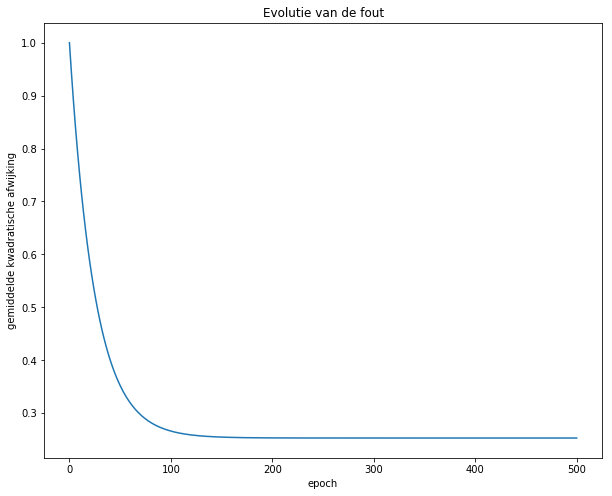

In [22]:
# grafiek evolutie fout
plt.figure(figsize=(10,8))
plt.plot(lijst_fout)
plt.xlabel('epoch')
plt.ylabel('gemiddelde kwadratische afwijking')
plt.title('Evolutie van de fout')
plt.show()

Experimenteer nu zelf. Laat het algoritme doorlopen voor zelfgekozen *m*, *q*, *epochs* en *learning rate*.

Lineaire regressie komt ook aan bod in de notebook 'Zeeniveau' en de notebook 'StomataHoogteBomen'.

<div>
    <h2>Referentielijst</h2> 
</div>

[1] Dua, D., & Karra Taniskidou, E. (2017). UCI Machine Learning Repository [http://archive.ics.uci.edu/ml]. <br> &nbsp; &nbsp; &nbsp; &nbsp; Irvine, CA: University of California, School of Information and Computer Science.<br>
[2] Fisher, R. A. (1936). The use of multiple measurements in taxonomic problems. *Annals of Eugenics*. 7(2), 179–188. <br> &nbsp; &nbsp; &nbsp; &nbsp; https://doi.org/10.1111/j.1469-1809.1936.tb02137.x.<br>
[3] No machine-readable author provided. Dlanglois assumed (based on copyright claims). <br> &nbsp; &nbsp; &nbsp; &nbsp;
[CC BY-SA 3.0 (http://creativecommons.org/licenses/by-sa/3.0/)], via Wikimedia Commons

<img src="../.images/cclic.png" alt="Banner" align="left" style="width:80px;"/><br><br>
Notebook KIKS, zie <a href="http://www.aiopschool.be">ai op school</a>, van F. wyffels & N. Gesquière is in licentie gegeven volgens een <a href="http://creativecommons.org/licenses/by-nc-sa/4.0/">Creative Commons Naamsvermelding-NietCommercieel-GelijkDelen 4.0 Internationaal-licentie</a>.